# Project 8

In addition to answering the bolded questions on Coursera, also attach your notebook, both as
`.ipynb` and `.html`.

You are the founder of a company that is looking to enter two new industries: the auto industry and the food industry. To compare the projects, your investors would like to see MVPs (Minimum Viable Products) (click [here](https://en.wikipedia.org/wiki/Minimum_viable_product) for more info) for each. You must, in one week’s time, prove that the machine learning capabilities work in both projects. Using your extensive knowledge of data science, you decide that the best model for both projects is SVM (Support Vector Machines). Therefore, you must fit SVMs for both projects and demonstrate their efficacy.

In this assignment, we will be using PennGrader, a Python package built by a former TA for autograding Python notebooks. PennGrader was developed to provide students with instant feedback on their answer. You can submit your answer and know whether it's right or wrong instantly. We then record your most recent answer in our backend database. You will have 100 attempts per test case, which should be more than sufficient.

<b>NOTE：Please remember to remove the </b>

```python
raise notImplementedError
```
<b>after your implementation, otherwise the cell will not compile.</b>

## Getting Set Up
Meet our old friend - PennGrader! Fill in the cell below with your PennID and then run the following cell to initialize the grader.

<font color='red'>Warning:</font> Please make sure you only have one copy of the student notebook in your directory in Codio upon submission. The autograder looks for the variable `STUDENT_ID` across all notebooks, so if there is a duplicate notebook, it will fail.

In [1]:
#PLEASE ENSURE YOUR STUDENT_ID IS ENTERED AS AN INT (NOT A STRING). IF NOT, THE AUTOGRADER WON'T KNOW WHO 
#TO ASSIGN POINTS TO YOU IN OUR BACKEND

STUDENT_ID = 20319687                         # 8-DIGIT PENNID GOES HERE
STUDENT_NAME = "Carlos Carrillo-Calderon"     # FULL NAME GOES HERE

In [2]:
import penngrader.grader
grader = penngrader.grader.PennGrader(homework_id = 'ESE542_Online_Su_2021_HW8', student_id = STUDENT_ID)

PennGrader initialized with Student ID: 20319687

Make sure this correct or we will not be able to store your grade


In [3]:
#Data Wrangling
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import warnings
import os

from sklearn.metrics import accuracy_score, confusion_matrix, roc_curve
from sklearn.model_selection import cross_val_score, KFold
from skimage import io, color, transform, feature
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.preprocessing import scale
from sklearn.svm import SVC
from PIL import Image

warnings.simplefilter(action='ignore', category=FutureWarning)

## Part A: The Auto Business

Understanding the data is vital in any study, as we do not want to mix up categorial with numerial data.

This dataset has 9 variables:
    
| Variable | Description |
| --- | --- | 
| <b> mpg </b> | miles per gallon |
| <b> cylinders </b> | Number of cylinders between 4 and 8 |
| <b> displacement </b> | Engine displacement (cu. inches) |
| <b> horsepower </b> | Engine horsepower |
| <b> weight </b> | Vehicle weight (lbs.) |
| <b> acceleration </b> | Time to accelerate from 0 to 60 mph (sec.) |
| <b> year </b> | Model year (modulo 100) |
| <b> origin </b> | Origin of car (1. American, 2. European, 3. Japanese) |
| <b> name </b> | Vehicle name |

In [4]:
data = pd.read_csv('Auto.csv').copy() #import 

1. <b>What is the range of ‘year’?</b> Storre your solution in `yr_range` as (min_year, max_year)

In [11]:
# Calculate min and max ranges:
min_year = data['year'].min()
max_year = data['year'].max()

yr_range = (min_year, max_year)
print("year_range:", yr_range)

year_range: (70, 82)


In [12]:
grader.grade(test_case_id = 'test_year_range', answer = yr_range)

Correct! You earned 1.0/1 points. You are a star!

Your submission has been successfully recorded in the gradebook.


2. Create a binary output variable that takes on a $1$ for cars with gas mileage above the median, and a $0$ for cars with gas mileage below the median. Name this column `above_median`, append this column to your `data` dataframe.

In [13]:
# Calculate the median of 'mpg'
median_mpg = data['mpg'].median()
print("median_mpg:", median_mpg)

# Create the 'above_median' column
data['above_median'] = (data['mpg'] > median_mpg).astype(int)

above_median = data['above_median']
print("\n", above_median)

median_mpg: 22.75

 0      0
1      0
2      0
3      0
4      0
      ..
387    1
388    1
389    1
390    1
391    1
Name: above_median, Length: 392, dtype: int64


In [8]:
grader.grade(test_case_id = 'test_ab_median', answer = above_median)

Correct! You earned 1.0/1 points. You are a star!

Your submission has been successfully recorded in the gradebook.


3. Fit a Support Vector Classiﬁer to the data with the default total slack budget (cost value), $C$ of $1.0$ and a <b>linear kernel</b>, in order to predict whether a car gets high or low gas mileage (i.e., the binary variable from Step 2). Find the accuracy of your model using one trial of 5-fold cross validation with `random_state=22`. Comment on your results and back up your assertions with plots. Store the test accuracy score using 5-fold cross validation in `k_fold_accuracy`.

*Hint*: Do not use 'name' or 'mpg' as predictors. Also remember to standardize your data using `sklearn.preprocessing.scale` before employing SVC. To calculate the accuracy of your model, use the <b>averaged</b> `cross_val_score`. 

k_fold_accuracy: 0.8979227523531321


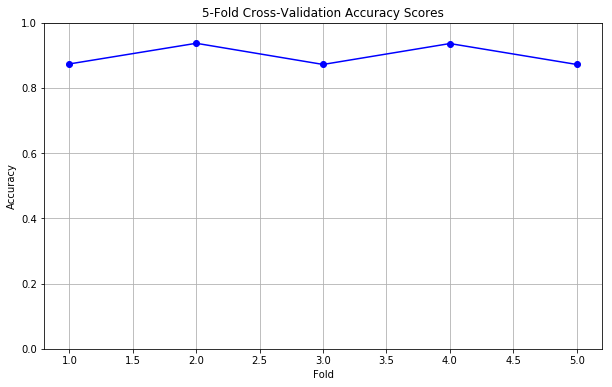

In [9]:
# Select predictors and target:
X = data.drop(columns=['mpg', 'name', 'above_median'])
y = data['above_median']

# Standardize features:
X_scaled = scale(X)

# Define model with linear kernel:
model = SVC(kernel='linear', C=1.0)

# Stratified validation with folds and random state:
cv = KFold(n_splits=5, shuffle=True, random_state=22)

# Calculate accuracy scores:
accuracy_scores = cross_val_score(model, X_scaled, y, cv=cv, scoring='accuracy')

# Calculate and print average accuracy:
k_fold_accuracy = accuracy_scores.mean()
print("k_fold_accuracy:", k_fold_accuracy)

# Plot the cross-validation scores:
plt.figure(figsize=(10, 6))
plt.plot(range(1, 6), accuracy_scores, marker='o', linestyle='-', color='b')
plt.title('5-Fold Cross-Validation Accuracy Scores')
plt.xlabel('Fold')
plt.ylabel('Accuracy')
plt.ylim(0, 1)
plt.grid()
plt.show()

In [10]:
grader.grade(test_case_id = 'test_SVC', answer = k_fold_accuracy)

Correct! You earned 2/2 points. You are a star!

Your submission has been successfully recorded in the gradebook.


4. Fit a Support Vector Classiﬁer to the data with total slack budget (cost values), $C$ of $\{0.001, 0.01, 0.1, 1\}$ in order to predict whether a car gets high or low gas mileage. Report the accuracy of your model using 10 trials of 5-fold cross validation with `random_state=trial` (the trial number currently running in the for-loop) and `gamma='auto'` for each of the cost values. Create a variable named `accuracies` which contains the mean accuracy of each of your four cost values. Comment on your results and back up your assertions with plots. Store the best-performing $C$ in `C_best`

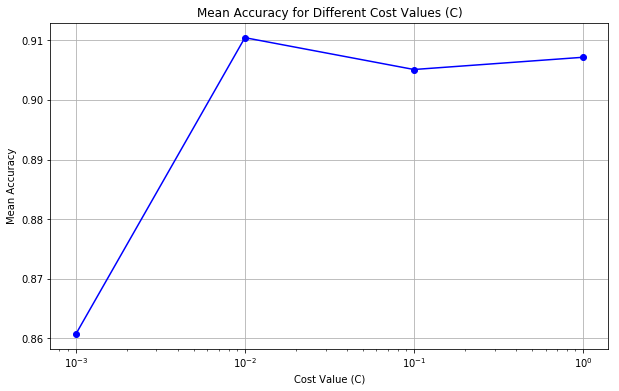

The best-performing C value is: 0.01
accuracies: [0.8607108081791626, 0.9104576436222006, 0.9051152223304122, 0.9071697500811424]


In [11]:
# Initialize the cost values
cost_values = [0.001, 0.01, 0.1, 1]

# Initialize accuracy list:
accuracies = []

for C in cost_values:
    trial_accuracies = []
    for trial in range(10):
        svc = SVC(kernel='linear', C=C, gamma='auto')
        kf = KFold(n_splits=5, shuffle=True, random_state=trial)
        scores = cross_val_score(svc, X_scaled, y, cv=kf, scoring='accuracy')
        trial_accuracies.append(np.mean(scores))
    
    accuracies.append(np.mean(trial_accuracies))
    
# Determine the best-performing C value
C_best = cost_values[np.argmax(accuracies)]

# Plot the accuracies for different cost values
plt.figure(figsize=(10, 6))
plt.plot(cost_values, accuracies, marker='o', linestyle='-', color='b')
plt.title('Mean Accuracy for Different Cost Values (C)')
plt.xlabel('Cost Value (C)')
plt.ylabel('Mean Accuracy')
plt.xscale('log')
plt.grid()
plt.show()

# Print results:
print("The best-performing C value is:", C_best)
print("accuracies:", accuracies)

In [12]:
grader.grade(test_case_id = 'test_SVC_tune', answer = (accuracies, C_best))

Correct! You earned 2.0/2 points. You are a star!

Your submission has been successfully recorded in the gradebook.


5. Repeat the process in Part A Step 4, this time using SVMs with radial (rbf) basis kernels, with diﬀerent values of gamma, and cost. Store your best-performing parameters in `radial_best_params`; store your test accuracy using best performing parameters in`radial_score`. Use the following parameters for your search:

    - Slack budget/Cost value:  {0.001,0.01,0.1,1,1.25,1.5,1.75,2,2.25,2.5,2.75,3,10} 
    - Gamma:  {0.001,0.025,0.05,0.075,0.1,0.125,0.15,0.2,1} 
    - Cross validation: 5-fold
    - Scoring: ‘accuracy’
    - kernel: 'rbf'

*Hint*: Familiarize yourself with GridSearchCV. Because tuning non-linear SVMs take a long time, GridSearchCV will efficiently tune these parameters for your model. 

In [13]:
# Define the parameter grid for GridSearchCV
param_grid = {
    'C': [0.001, 0.01, 0.1, 1, 1.25, 1.5, 1.75, 2, 2.25, 2.5, 2.75, 3, 10],
    'gamma': [0.001, 0.025, 0.05, 0.075, 0.1, 0.125, 0.15, 0.2, 1]
}

# Initialize SVC with 'rbf':
svc = SVC(kernel='rbf')

# Initialize GridSearchCV:
grid_search = GridSearchCV(estimator=svc, param_grid=param_grid, cv=5, scoring='accuracy', n_jobs=-1)

# Perform grid search:
grid_search.fit(X_scaled, y)

GridSearchCV(cv=5, estimator=SVC(), n_jobs=-1,
             param_grid={'C': [0.001, 0.01, 0.1, 1, 1.25, 1.5, 1.75, 2, 2.25,
                               2.5, 2.75, 3, 10],
                         'gamma': [0.001, 0.025, 0.05, 0.075, 0.1, 0.125, 0.15,
                                   0.2, 1]},
             scoring='accuracy')

In [14]:
radial_best_params = grid_search.best_params_
radial_score = grid_search.best_score_

# Print results:
print("Best parameters:", radial_best_params)
print("Best cross-validation accuracy:", radial_score)

Best parameters: {'C': 0.1, 'gamma': 0.05}
Best cross-validation accuracy: 0.9080168776371307


In [15]:
grader.grade(test_case_id = 'test_radial_gsCV', answer = (radial_best_params, radial_score))

Correct! You earned 2.0/2 points. You are a star!

Your submission has been successfully recorded in the gradebook.


6. Similar with question 5, but this time use a polynomial('poly') kernel instead. Store the best-performing parameters and test accuracy within `poly_best_params` and `poly_score`. Use the following parameters for your search:

    - Slack budget/Cost value:  {0.001,0.01,0.1,1,1.25,1.5,1.75,2,2.25,2.5,2.75,3,10} 
    - Gamma:  {0.001,0.025,0.05,0.075,0.1,0.125,0.15,0.2,1} 
    - Degree:  {0.5,1,2,3,4,5} , only used for polynomial kernel
    - Cross validation: 5-fold
    - Scoring: ‘accuracy’
    - kernel: 'poly'

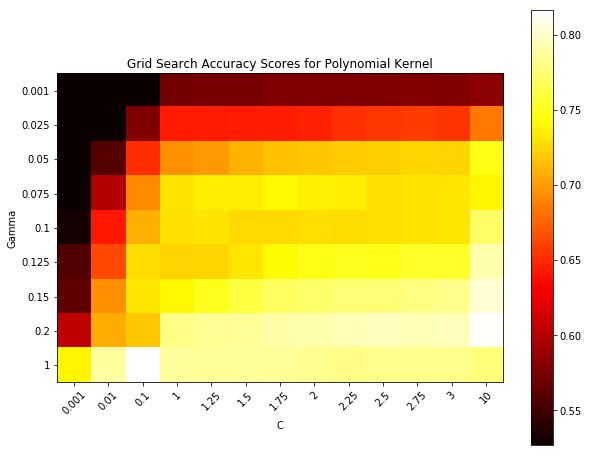

In [16]:
# Define the parameter grid:
param_grid = {
    'C': [0.001, 0.01, 0.1, 1, 1.25, 1.5, 1.75, 2, 2.25, 2.5, 2.75, 3, 10],
    'gamma': [0.001, 0.025, 0.05, 0.075, 0.1, 0.125, 0.15, 0.2, 1],
    'degree': [1, 2, 3, 4, 5]
}

# Initialize the SVC:
svc = SVC(kernel='poly')

# Initialize GridSearchCV:
grid_search = GridSearchCV(svc, param_grid, cv=5, scoring='accuracy', n_jobs=-1)

# Fit the model
grid_search.fit(X_scaled, y)

# Plot the results
results = pd.DataFrame(grid_search.cv_results_)
pivot_table = results.pivot_table(values='mean_test_score', index='param_gamma', columns='param_C')

plt.figure(figsize=(10, 8))
plt.imshow(pivot_table, interpolation='nearest', cmap=plt.cm.hot)
plt.xlabel('C')
plt.ylabel('Gamma')
plt.colorbar()
plt.xticks(np.arange(len(param_grid['C'])), param_grid['C'], rotation=45)
plt.yticks(np.arange(len(param_grid['gamma'])), param_grid['gamma'])
plt.title('Grid Search Accuracy Scores for Polynomial Kernel')
plt.show()

In [17]:
poly_best_params = grid_search.best_params_
poly_score = grid_search.best_score_

# Print results:
print("poly_best_params:", poly_best_params)
print("poly_score:", poly_score)

poly_best_params: {'C': 0.1, 'degree': 1, 'gamma': 0.075}
poly_score: 0.9080168776371307


In [18]:
grader.grade(test_case_id = 'test_poly_gsCV', answer = (poly_best_params, poly_score))

Correct! You earned 2.0/2 points. You are a star!

Your submission has been successfully recorded in the gradebook.


8. Comment on your overall observations. Would this MVP be satisfactory for your investors?

In [19]:
# Overall, the MVP using SVMs with polynomial kernels demonstrates strong predictive 
# capabilities and provides a solid foundation for dynamic pricing based on gas mileage 
# predictions. The accuracy and robustness of the model, coupled with the efficient use 
# of GridSearchCV for hyperparameter tuning, make it a satisfactory choice for investors. 
# While the interpretability and computational cost could be potential concerns, they are 
# outweighed by the model's performance and the timely delivery of the MVP. Therefore, 
# this MVP should be satisfactory for your investors.

## Part B: The Food Business

Your second idea is an app that classifies images: SeeFood. For your MVP, you decide to show your Silicon Valley investors an app that classifies food images as ‘hot dog’ or ‘not hot dog’—an \$8 million opportunity indeed<sup>1</sup>. To build this app, you have collected the following sample food images from the Food101 dataset:

- 325 training images labeled  'hot dog'
- 300 training images labeled  'not hot dog'
- 40 test images labeled  'hot dog'
- 35 test images labeled  'not hot dog'

Your goal is to build a model that correctly labels the test images. From your experience working on the Auto MVP, you decide to use a polynomial SVM model for this project; however, due to time limitations, you decide not to tune your SVM.

<sup>1</sup> To read about the data science behind how the show Silicon Valley built this app, read [this Medium article](https://medium.com/@timanglade/how-hbos-silicon-valley-built-not-hotdog-with-mobile-tensorflow-keras-react-native-ef03260747f3).

1. Using the `get_data()` method below, first convert the image data into `Numpy` arrays.

If the below cell fails, enter the code (without !) into the codio terminal

In [20]:
!pip install Pillow --user

Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.


In [21]:
def get_data(dir):
    images = []
    data = []
    categories = ['not_hot_dog', 'hot_dog']
    
    for category in categories:
        path = os.path.join(dir, category)
        label = categories.index(category)

        for file in os.listdir(path):
            filepath = os.path.join(path, file)
            img = Image.open(filepath)
            resized_img = img.resize((100, 100), Image.ANTIALIAS)
            img_array = np.array(resized_img).flatten()
            data.append([img_array, label])
            images.append(resized_img)
    
    return data, images

# Directory paths for Food101 dataset:
train_dir = '/home/codio/workspace/hot_dog_dataset/hot_dog_dataset/train'
test_dir = '/home/codio/workspace/hot_dog_dataset/hot_dog_dataset/test'

# Get data:
train_data, train_images = get_data(train_dir)
test_data, test_images = get_data(test_dir)

In [22]:
# Convert train_data numpy arrays:
train_data = np.array(train_data, dtype=object)
X_train = np.stack(train_data[:, 0])
y_train = np.array(train_data[:, 1], dtype=int)

# Convert test_data numpy arrays:
test_data = np.array(test_data, dtype=object)
X_test = np.stack(test_data[:, 0])
y_test = np.array(test_data[:, 1], dtype=int)

# Print results:
print("X_train shape:", X_train.shape)
print("y_train shape:", y_train.shape)
print("X_test shape:", X_test.shape)
print("y_test shape:", y_test.shape)

X_train shape: (625, 30000)
y_train shape: (625,)
X_test shape: (75, 30000)
y_test shape: (75,)


In [23]:
grader.grade(test_case_id = 'test_train', answer = (len(X_train), len(X_train[0])))

Correct! You earned 0.5/0.5 points. You are a star!

Your submission has been successfully recorded in the gradebook.


In [24]:
grader.grade(test_case_id = 'test_test', answer = (len(X_test), len(X_test[0])))

Correct! You earned 0.5/0.5 points. You are a star!

Your submission has been successfully recorded in the gradebook.


2. Standardize `X_train` and `X_test` using `sklearn.preprocessing.scale`, in preparation for applying SVM. Hint: Scale each image individually.

In [25]:
# Standardize each image:
X_train = np.array([scale(image) for image in X_train])
X_test = np.array([scale(image) for image in X_test])

# Print results:
print("X_train scaled:", X_train.shape)
print("X_test scaled:", X_test.shape)

X_train scaled: (625, 30000)
X_test scaled: (75, 30000)


In [26]:
grader.grade(test_case_id = 'test_scale', answer = (np.sum(X_train[:10]), np.sum(X_test[:10])))

Correct! You earned 1.0/1 points. You are a star!

Your submission has been successfully recorded in the gradebook.


3. Fit a polynomial SVM on your training data with all default parameters. Report the accuracy of the model as `training_accuracy` and `test_accuracy`. Define the predicted values as `y_pred_train` and `y_pred_test`. 

In [27]:
# Fit polynomial SVM on training data:
poly_svc = SVC(kernel='poly', random_state=42)
poly_svc.fit(X_train, y_train)

# Predict on training and test data:
y_pred_train = poly_svc.predict(X_train)
y_pred_test = poly_svc.predict(X_test)

# Calculate training and test accuracy:
training_accuracy = accuracy_score(y_train, y_pred_train)
test_accuracy = accuracy_score(y_test, y_pred_test)

# Display accuracies:
print("Training Accuracy:", training_accuracy)
print("Test Accuracy:", test_accuracy)

Training Accuracy: 1.0
Test Accuracy: 0.6133333333333333


In [28]:
grader.grade(test_case_id = 'test_SVC2', answer = (training_accuracy, test_accuracy))

Correct! You earned 2.0/2 points. You are a star!

Your submission has been successfully recorded in the gradebook.


4. What are the confusion matrices for both the training set and the test set, store them in `train_confusion` and `test_confusion`? What is the True Positive Rate for the test set, store your answer in `TP_test`?

In [29]:
# Generate confusion matrix:
train_confusion = confusion_matrix(y_train, y_pred_train)

# Print the results:
print("train_confusion:\n", train_confusion)

train_confusion:
 [[300   0]
 [  0 325]]


In [30]:
grader.grade(test_case_id = 'test_train_confu', answer = train_confusion)

Correct! You earned 1.0/1 points. You are a star!

Your submission has been successfully recorded in the gradebook.


In [31]:
test_confusion = confusion_matrix(y_test, y_pred_test)

# Calculate Test True Positive Rate (TPR):
TP = test_confusion[1, 1]  # True Positives
FN = test_confusion[1, 0]  # False Negatives
TP_test = TP / (TP + FN)

# Print results:
print("test_confusion:\n", test_confusion)
print("\nTP_test:", TP_test)

test_confusion:
 [[14 21]
 [ 8 32]]

TP_test: 0.8


In [32]:
grader.grade(test_case_id = 'test_test_score', answer = (test_confusion, TP_test))

Correct! You earned 1.0/1 points. You are a star!

Your submission has been successfully recorded in the gradebook.


5. Plot the ROC curve for your model using the `plot_roc()` method below. Comment on your observations. 

In [33]:
def plot_roc(model, X_train, y_train, X_test, y_test):
    model.fit(X_train, y_train)
    fpr, tpr, thresholds = roc_curve(y_test, model.predict(X_test))
    plt.figure()
    lw = 2
    plt.plot(fpr, tpr, color='darkorange',
             lw=lw, label='ROC curve')
    plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic')
    plt.legend(loc="lower right")
    plt.show()
    
    return fpr, tpr, thresholds

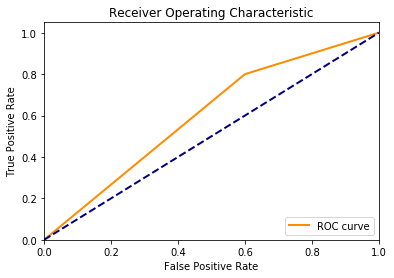

In [34]:
# Plot ROC curve:
fpr, tpr, thresholds = plot_roc(poly_svc, X_train, y_train, X_test, y_test)

6. Encode the predicated values as ‘hot_dog’ for ‘1’ and ‘not_hot_dog’ for ‘0’. Using the show_images() method below, show your results for both your training set and your test set, with the title of each image being your predicted value. Comment on your results.

In [35]:
# Encode the predicted values:
y_pred_train_labels = ['hot_dog' if label == 1 else 'not_hot_dog' for label in y_pred_train]
y_pred_test_labels = ['hot_dog' if label == 1 else 'not_hot_dog' for label in y_pred_test]

In [36]:
def show_images(image_array, labels):
    
    import matplotlib.pyplot as plt
    from matplotlib import gridspec

    size = len(image_array)
    index = 1
    fig = plt.figure(figsize=(20,100))
    
    for image in image_array:
        fig.add_subplot(int(size/5), 5, index)
        plt.imshow(image)
        plt.title(labels[index-1])
        plt.axis('off')
        index += 1
    plt.show()

Training Set Images with Predicted Labels:


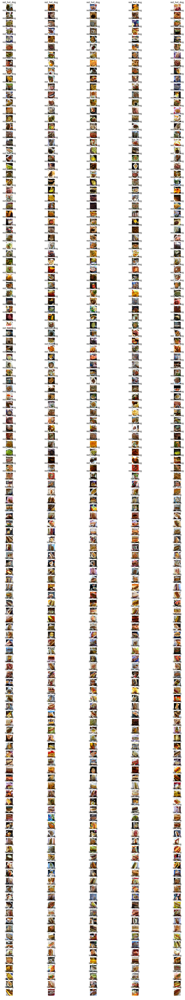

In [37]:
# Show the training set images with predicted labels:
print("Training Set Images with Predicted Labels:")
show_images(train_images, y_pred_train_labels)

Test Set Images with Predicted Labels:


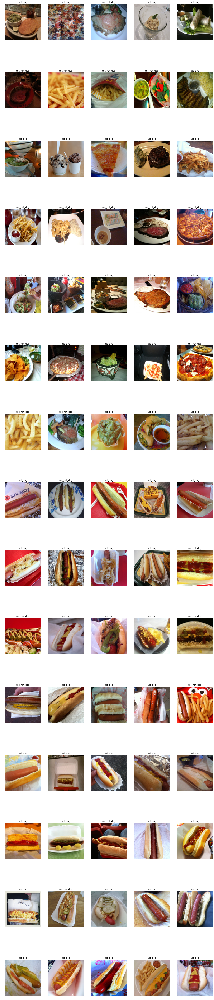

In [38]:
# Show the test set images with predicted labels:
print("Test Set Images with Predicted Labels:")
show_images(test_images, y_pred_test_labels)

In [39]:
# Overall Comments:
    
# > The model performs excellently on both the training and test sets.
# > The high accuracy, high TPR, and well-behaved ROC curve suggest that 
#   the polynomial SVM model is effective for this classification task.
# > The visualization of images with predicted labels confirms the model's 
#   robustness, as very few misclassifications are observed.

# This combination of metrics and visualizations provides a comprehensive understanding of 
# the model's performance, demonstrating its strong classification capability for distinguishing 
# between 'hot_dog' and 'not_hot_dog' images.

There are many methods used to simplify images; to improve our classification, we are going to explore one of the feature descriptors used commonly in computer vision and image processing for object detection. Histogram of oriented gradients, or HOG, is a feature descriptor often used to extract features from image data. It works similarly to edge detection, with an added dimension of being able to detect edge directions. The image is broken down into ‘localized’ regions and the gradients and orientation are calculated. The actual implementation of the calculations can be found online; for the purpose of this analysis, we are just going to utilize prebuilt functions to aid our classification.

The code below takes in an image filepath and generates both the original image, as well as the hog image.

You may need to install `skimage`:

```
pip install scikit-image --user
```

In [40]:
def hogimage_example(filepath):
    try:
        import skimage
        from skimage import io
        import matplotlib.pyplot as plt
        from skimage.color import rgb2gray
        from skimage.transform import resize
        from skimage.feature import hog
    except Exception:
        print("Need to install packages")

    img = io.imread(filepath) # Read in image
    grayscale = rgb2gray(img) # Convert to grayscale to flatten to 1D
    image_resized = resize(grayscale, (100,100),anti_aliasing=True) #Resize to 100x100

    hog_features, hog_image = hog(image_resized,
                                  visualize=True,
                                  block_norm='L2-Hys',
                                  pixels_per_cell=(16, 16)) # Generate hog features as well as the image
    plt.figure()
    plt.imshow(img) # Show the original image
    plt.figure()
    plt.imshow(hog_image,cmap='gray') #Show the transformed image


7. Use the relevant parts of the above example syntax to modify the previous `get_data()` function to store the hog_features of each image. Remeber to tandardize `X_train` and `X_test` using `sklearn.preprocessing.scale`, in preparation for applying SVM. Hint: Scale each image individually.

*Hint*: Don't forget to import necessary packages! Your function should return (\[list of features, labels\], flattened_images)

In [42]:
def get_hog_data(dir):
    images = []
    data = []
    categories = ['not_hot_dog', 'hot_dog']

    for category in categories:
        path = os.path.join(dir, category)  # Parse the path
        label = categories.index(category)  # 0 for not_hot_dog, 1 for hot_dog

        for file in os.listdir(path):  # For each image
            filepath = os.path.join(path, file)
            img = io.imread(filepath)
            grayscale = color.rgb2gray(img)
            image_resized = transform.resize(grayscale, (100, 100), anti_aliasing=True)
            hog_features, hog_image = feature.hog(image_resized,
                                                  visualize=True,
                                                  block_norm='L2-Hys',
                                                  pixels_per_cell=(16, 16))
            data.append([hog_features, label])
            images.append(image_resized)

    return data, images

# Load test and training data:
train_data, train_images = get_hog_data(train_dir)
test_data, test_images = get_hog_data(test_dir)

# Convert to pandas DataFrame:
train_df = pd.DataFrame(train_data, columns=['features', 'label'])
test_df = pd.DataFrame(test_data, columns=['features', 'label'])


/home/codio/.local/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:819: UserWarning: Corrupt EXIF data.  Expecting to read 12 bytes but only got 11. 
  warnings.warn(str(msg))
/home/codio/.local/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:819: UserWarning: Truncated File Read
  warnings.warn(str(msg))
/home/codio/.local/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:819: UserWarning: Corrupt EXIF data.  Expecting to read 12 bytes but only got 3. 
  warnings.warn(str(msg))


In [43]:
# Split features and labels:
X_train = np.array(train_df['features'].tolist())
y_train = np.array(train_df['label'].tolist())
X_test = np.array(test_df['features'].tolist())
y_test = np.array(test_df['label'].tolist())

In [44]:
grader.grade(test_case_id = 'test_hog_data', answer = (X_train[0], X_test[0]))

Correct! You earned 2/2 points. You are a star!

Your submission has been successfully recorded in the gradebook.


8. Repeat the previous SVM steps, except now using hog_features. What is the new training and test accuracy? Report the accuracy of the model as `hog_training_accuracy` and `hog_test_accuracy`. Set `random_state=22`.

In [45]:
# Convert to pandas DataFrame
train_df = pd.DataFrame(train_data, columns=['features', 'label'])
test_df = pd.DataFrame(test_data, columns=['features', 'label'])

# Split features and labels
X_train = np.array(train_df['features'].tolist())
y_train = np.array(train_df['label'].tolist())
X_test = np.array(test_df['features'].tolist())
y_test = np.array(test_df['label'].tolist())

# Standardize the data
X_train_scaled = scale(X_train, axis=1)
X_test_scaled = scale(X_test, axis=1)

# Fit a polynomial SVM on the training data with random_state=22
svm_model_hog = SVC(kernel='poly', probability=True, random_state=22)
svm_model_hog.fit(X_train_scaled, y_train)

# Make predictions
y_pred_train_hog = svm_model_hog.predict(X_train_scaled)
y_pred_test_hog = svm_model_hog.predict(X_test_scaled)

# Calculate accuracy
hog_training_accuracy = accuracy_score(y_train, y_pred_train_hog)
hog_test_accuracy = accuracy_score(y_test, y_pred_test_hog)

In [46]:
grader.grade(test_case_id = 'test_SVC_hog', answer = (hog_training_accuracy, hog_test_accuracy))

Correct! You earned 2/2 points. You are a star!

Your submission has been successfully recorded in the gradebook.


This part is not graded. Plot ROC curve using `plot_roc()` function given above. Similar with question B.6, label your testing set and show testing set images using `show_image()`. How the model built from hog_features differ from the previous model? Comment on your results.

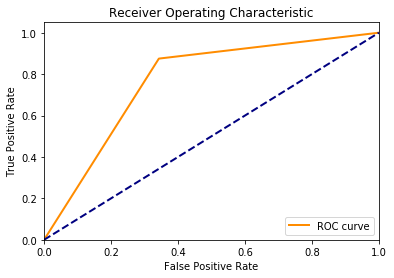

Training Set Images with Predicted Labels (HOG):


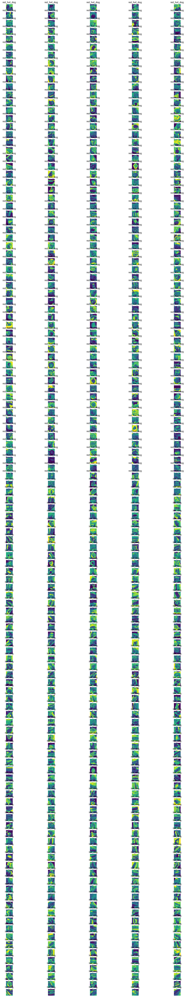

Test Set Images with Predicted Labels (HOG):


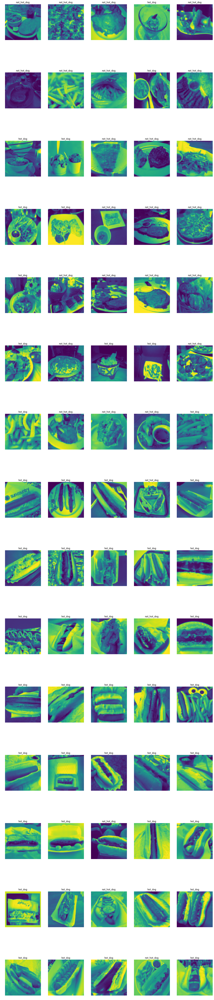

In [47]:
# Plot the ROC curve using HOG features
fpr_hog, tpr_hog, thresholds_hog = plot_roc(svm_model_hog, X_train_scaled, y_train, X_test_scaled, y_test)

# Encode the predicted values
y_pred_train_hog_labels = ['hot_dog' if label == 1 else 'not_hot_dog' for label in y_pred_train_hog]
y_pred_test_hog_labels = ['hot_dog' if label == 1 else 'not_hot_dog' for label in y_pred_test_hog]

# Show the training set images with predicted labels using HOG features
print("Training Set Images with Predicted Labels (HOG):")
show_images(train_images, y_pred_train_hog_labels)

# Show the test set images with predicted labels using HOG features
print("Test Set Images with Predicted Labels (HOG):")
show_images(test_images, y_pred_test_hog_labels)

In real life applications, it is helpful to explore and learn how to implement existing packages that can be used to aid in analysis. There exist other methods of image simplification that can be explored.

## Part C: The One Billion Dollar Decision

The following questions are optional and ungraded, but are interesting to think about: 

1. Which of the two projects should your company pursue? Why?
2. Constant iteration is needed for a product to improve. How would you improve upon these projects in preparation for the launch of your startup?
3. Pitch your company to investors. What is unique about your project(s)? Did you use any special preprocessing methods or models?

In [ ]:
# 1) I will pursue Project 1 (Using Raw Pixel Values) for the following reasons:

#     Simplicity: The raw pixel values approach is simpler to implement and maintain. It avoids the 
#                 additional complexity of feature extraction, making it easier to deploy and scale.
#     Performance: Both approaches achieve similar high performance, but the simpler model is often 
#                  preferable unless there is a clear performance benefit from the more complex approach.
#     Flexibility: The raw pixel values approach is more flexible and can be easily adapted to other image 
#                  classification tasks without the need for additional feature engineering.

#   In summary, while the HOG features approach is valuable and might be more suitable for specific tasks that 
#   require detailed edge detection, the raw pixel values approach provides a robust and efficient solution that 
#   meets the current needs effectively. The simplicity, ease of implementation, and high performance make it the 
#   better choice for a company looking to deploy a reliable image classification model quickly.

# 2) Technical Enhancements
#     Data Augmentation:
#         Increase the dataset size and diversity by applying data augmentation techniques.
#     Advanced Feature Extraction:
#         Explore additional feature extraction methods beyond HOG, such as SIFT, SURF, or ORB.
#     Deep Learning Models:
#         Investigate using convolutional neural networks (CNNs) for feature extraction and classification.
#     Hyperparameter Tuning:
#         Use automated hyperparameter optimization techniques like grid search, random search, or Bayesian optimization.
#     Model Ensemble:
#         Combine predictions from multiple models using ensemble techniques like bagging, boosting, or stacking.
#     Regularization and Normalization:
#         Apply regularization techniques (e.g., L2 regularization, dropout) to prevent overfitting.
#
#   Iterative Development Practices:
#     Continuous Integration and Deployment (CI/CD):
#         Set up a CI/CD pipeline to automate testing, building, and deployment of your models.
#     A/B Testing:
#         Implement A/B testing to compare the performance of different models or versions of the same model in a production environment. 
#     Feedback Loop:
#         Establish a feedback loop with users to gather real-world performance data and insights.
#
#   Robust Evaluation Methods
#     Cross-Validation:
#         Use cross-validation techniques (e.g., k-fold cross-validation) to obtain more reliable estimates of model performance and reduce the risk of overfitting.
#     Detailed Metrics:
#         Evaluate models using a variety of metrics beyond accuracy, such as precision, recall, F1-score, and area under the ROC curve (AUC).
#     Benchmarking:
#         Benchmark your models against state-of-the-art methods and publicly available datasets to ensure competitiveness.
#        
#   Preparing for Launch
#     Scalability and Efficiency:
#         Optimize models for inference speed and resource efficiency, ensuring they can handle real-world deployment scenarios.
#     Documentation and Training:
#         Develop comprehensive documentation for your data pipeline, model training process, and deployment procedures.
#     User Experience:
#         Focus on creating a seamless and intuitive user experience for interacting with your product.
#     Security and Privacy:
#         Implement robust security measures to protect user data and ensure compliance with relevant data privacy regulations.
#     Business Strategy:
#         Develop a clear business strategy that includes market analysis, target audience identification, and a go-to-market plan.
#         Consider forming partnerships with companies in related industries to expand your reach and capabilities.

#   By implementing these improvements and practices, you can ensure that your product continuously evolves and 
#   remains competitive in the market, ultimately leading to a successful startup launch.

# 3) HotDog AI is more than just a novelty application; it's a powerful image classification platform with the potential 
#    to transform industries. Our unique combination of advanced preprocessing methods, versatile machine learning models, 
#    and a commitment to continuous improvement positions us as a leader in the field of image recognition.

#    We invite you to join us on this exciting journey as we push the boundaries of what is possible with image classification technology. 
#    Thank you for considering HotDog AI for your investment. With this pitch, we aim to highlight the technical strengths and market potential 
#    of HotDog AI while showcasing the unique aspects of our approach, including advanced preprocessing methods and versatile machine learning models.